## Visualization of CNN: Grad-CAM
* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.

In [25]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [26]:
resnet34 = models.resnet34(weights='ResNet34_Weights.IMAGENET1K_V1')  # New PyTorch interface for loading weights!
resnet34.eval() # set the model to evaluation mode

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)


Input image must be of size (3x224x224). 

First convolution layer with maxpool. 
Then 4 ResNet blocks. 

Output of the last ResNet block is of size (512x7x7). 

Average pooling is applied to this layer to have a 1D array of 512 features fed to a linear layer that outputs 1000 values (one for each class). No softmax is present in this case. We have already the raw class score!

In [27]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class 
print(classes)

{0: 'tench, Tinca tinca', 1: 'goldfish, Carassius auratus', 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 3: 'tiger shark, Galeocerdo cuvieri', 4: 'hammerhead, hammerhead shark', 5: 'electric ray, crampfish, numbfish, torpedo', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich, Struthio camelus', 10: 'brambling, Fringilla montifringilla', 11: 'goldfinch, Carduelis carduelis', 12: 'house finch, linnet, Carpodacus mexicanus', 13: 'junco, snowbird', 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 15: 'robin, American robin, Turdus migratorius', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water ouzel, dipper', 21: 'kite', 22: 'bald eagle, American eagle, Haliaeetus leucocephalus', 23: 'vulture', 24: 'great grey owl, great gray owl, Strix nebulosa', 25: 'European fire salamander, Salamandra salamandra', 26: 'common newt, Triturus vulgaris', 27: 'eft', 28: 'spotted salamander, Ambystoma maculatum', 29: 'axolotl, mu

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [4]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    # Note: If the inverse normalisation is required, apply 1/x to the above object
    
    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [28]:

# if not os.path.exists("data"):
#     os.mkdir("data")
# if not os.path.exists("data/TP2_images"):
#     os.mkdir("data/TP2_images")
#     !cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2023/TP2/TP2_images.zip" && unzip TP2_images.zip

dir_path = "data" 
dataset = preprocess_image(dir_path)

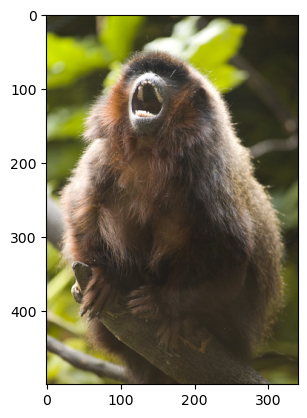

In [42]:
# show the orignal image 
index = 16
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [30]:
output = resnet34(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [13.077124 10.977328 10.554378]


### Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 


* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully.
 + More on [autograd](https://pytorch.org/tutorials/beginner/basics/autogradqs_tutorial.html) and [hooks](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks)
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: ‘pug, pug-dog’ | Class: ‘tabby, tabby cat’
- | - 
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

In [31]:
def resize_image(dir_path):
    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224,
        #     transforms.ToTensor()
            ])) #normalize the tensor

    return (dataset)

In [32]:
resized_dataset = resize_image(dir_path)

In [33]:
def Grad_CAM(image : torch.Tensor, category : int, debug = True) :
    # Model
    resnet34 = models.resnet34(weights='ResNet34_Weights.IMAGENET1K_V1') 
    resnet34.eval() # set the model to evaluation mode
    last_fc = resnet34.fc
    last_conv = resnet34.layer4[-1].conv2

    # Define hook
    if debug :
        def print_grad(self, grad_input, grad_output) :
            print('Inside ' + self.__class__.__name__ + ' backward')
            print('Inside class:' + self.__class__.__name__)
            print('grad_input size:', grad_input[0].size())
            print('grad_output size:', grad_output[0].size())
            print('grad_input norm:', grad_input[0].norm())

        def print_fwd(self, input, output) :
            print('Inside ' + self.__class__.__name__ + ' forward')
            print('Inside class:' + self.__class__.__name__)
            print('input size:', input[0].size())
            print('output size:', output[0].size())
            print('input norm:', input[0].norm())
        last_fc.register_backward_hook(print_grad)
        last_conv.register_forward_hook(print_fwd)
        last_conv.register_backward_hook(print_grad)

    def save_grad(self, grad_input, grad_output) :
        global saved_grad
        saved_grad = grad_output[0]

    def save_fwd(self, input, output) :
        global saved_output
        saved_output = output[0]

    last_conv.register_forward_hook(save_fwd)
    last_conv.register_full_backward_hook(save_grad)

    # Forward propagate image
    output = resnet34(image.view(1, 3, 224, 224))

    # Backward propagate from a gradient with A in category, 0 elsewhere
    output_cat = output[0, category]
    output_cat.backward()

    with torch.no_grad() :
        importances = torch.mean(torch.mean(saved_grad, 3), 2).flatten() #torch.Size([512])
        relu = nn.ReLU()
        heatmap = relu(torch.sum(torch.mul(importances[..., None, None], saved_output), dim = 0))
        if debug :
            print('output', saved_output.shape) # torch.Size([512, 7, 7])
            print('grad', saved_grad.shape) #torch.Size([1, 512, 7, 7])
            print('importances', importances.shape) #torch.Size([512])
            print('mul', torch.mul(importances[..., None, None], saved_output).shape)  #torch.Size([1, 512, 7, 7])
            print('sum', torch.sum(torch.mul(importances[..., None, None], saved_output), dim = 0).shape)  #torch.Size([1, 512, 7, 7])
            print('heatmap', heatmap.shape)
        heatmap_rescaled = nn.functional.interpolate(heatmap.view(1, 1, 7, 7), (224, 224), mode = 'bilinear')
    return (heatmap_rescaled - heatmap_rescaled.min()) / (heatmap_rescaled.max() - heatmap_rescaled.min())

tensor(1.) tensor(0.)


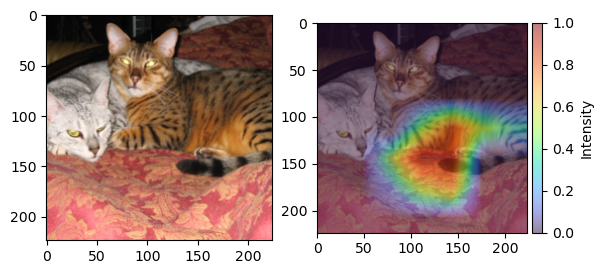

In [39]:
#Testing Grad_CAM function
index = 5
image = dataset[index][0]
heatmap = Grad_CAM(image, 5, debug = False)
print(heatmap.max(), heatmap.min())
# Plot
input_image = resized_dataset[index][0]
fig, ax = plt.subplots(1, 2)
ax[0].imshow(input_image)
ax[1].imshow(input_image)
heatmap_fig = ax[1].imshow(heatmap.view(224, 224), alpha = 0.5, cmap='turbo')

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(heatmap_fig, cax=cax)
cbar.set_label('Intensity') 

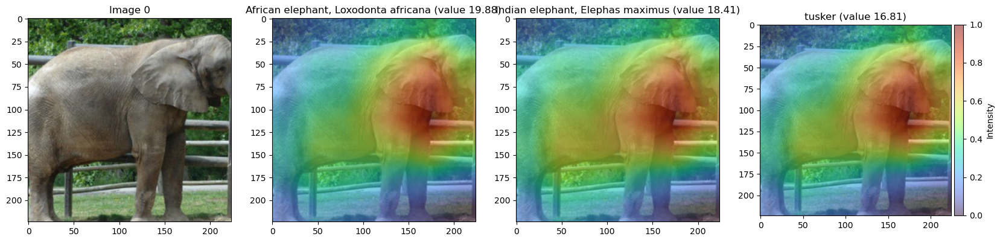

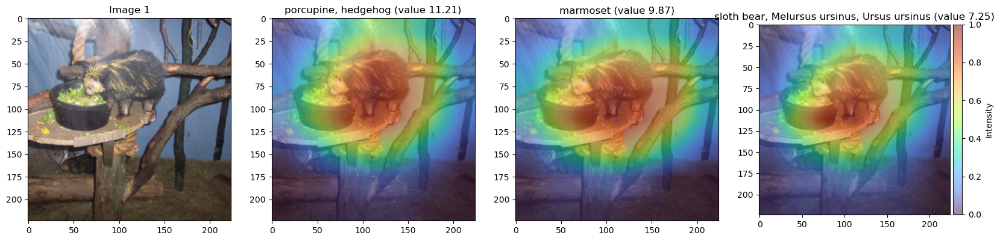

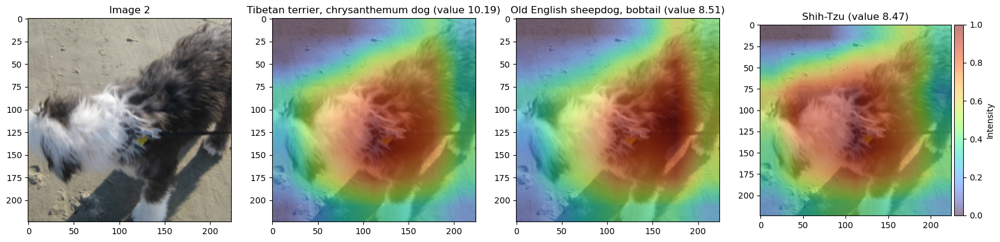

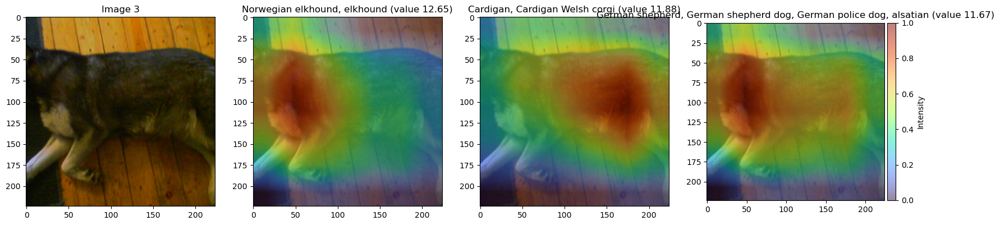

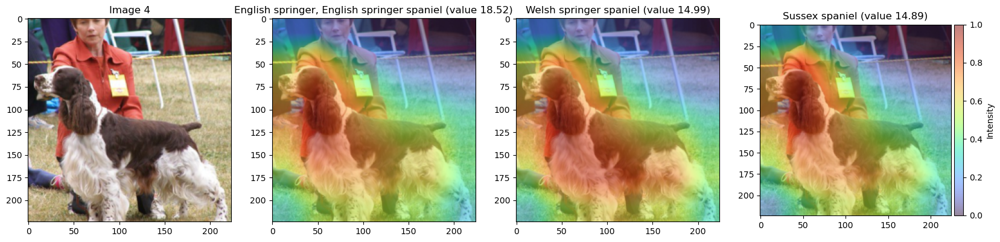

...

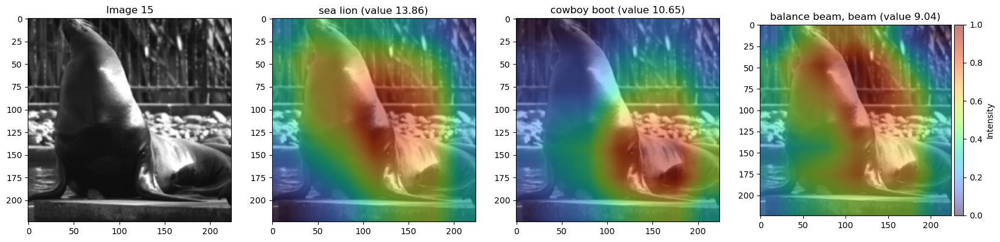

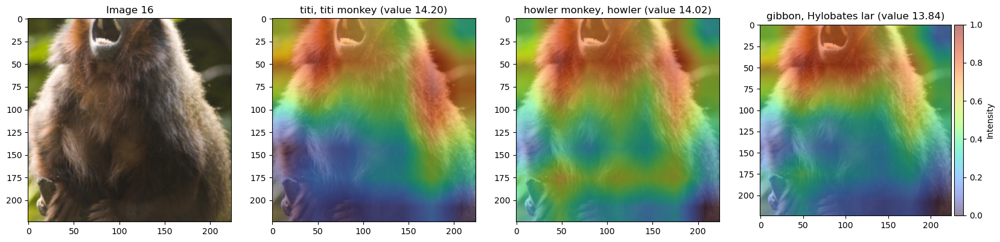

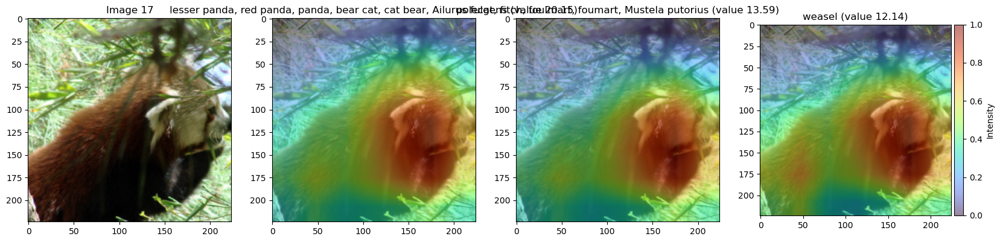

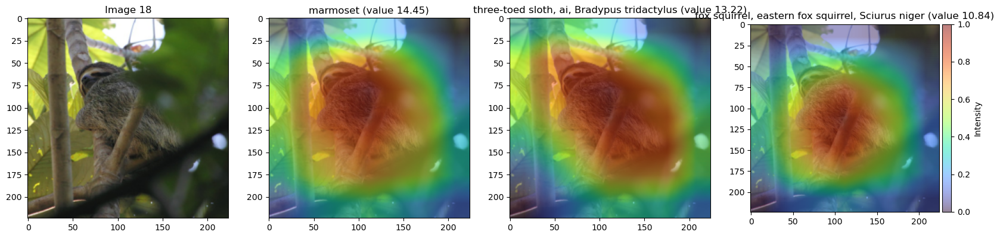

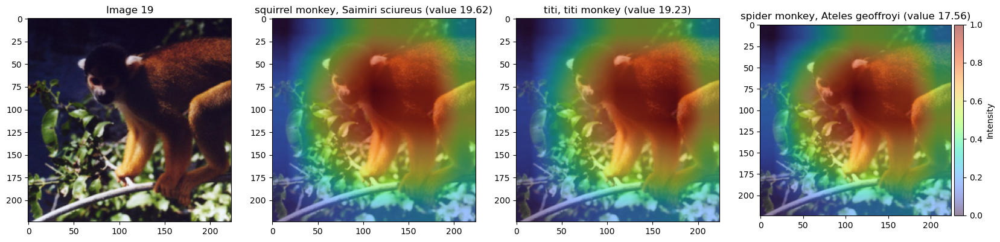

In [41]:
for index in range(len(dataset)) :
    image = dataset[index][0]
    input_image = resized_dataset[index][0]
    output = resnet34(dataset[index][0].view(1, 3, 224, 224))
    values, indices = torch.topk(output, 3)
    top3_categories = indices[0].numpy()
    top3_values = values[0].detach().numpy() 
    fig, ax = plt.subplots(1, 4, figsize=(20, 8))
    ax[0].imshow(input_image)
    ax[0].set_title(f"Image {index}")
    for c, category in enumerate(top3_categories) :
        heatmap = Grad_CAM(image, category, debug = False)
        ax[c + 1].imshow(input_image)
        heatmap_fig = ax[c + 1].imshow(heatmap.view(224, 224), alpha = 0.5, cmap='turbo')
        ax[c + 1].set_title(f"{classes[category]} (value {top3_values[c]:.2f})")
    divider = make_axes_locatable(ax[3])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = fig.colorbar(heatmap_fig, cax=cax)
    # cbar = fig.colorbar(heatmap_fig, ax=ax[3])
    cbar.set_label('Intensity') 


#### Comments
* Implementation
The GradCAM algorithm is implemented focusing on the last convolution layer thanks to hooks, that enable having access to a flow in the model at a particular node during forward or backward. A heatmap is built by first averaging across features activation for each pixel of the 7x7 image, weighted by an importance score. The importance score denotes the importance of each feature in the output, with respect to the gradient "backwarded" for a chosen category. These means are then upsampled to have a 224x224 image, using a bilinear interpolation (used to have a smooth heatmap). This heatmap is normalized between 0 and 1 to have a better vizualization.

* **Test**
The algorithm is tested for 20 ImageNet images of animals, on the ResNet34 model. For each images, three heatmaps are observed for the first three categories classified by the model.

* **Analysis**
The results seems to be relevant as in nearly all the images, there is a convex maximal lobe on the animal (or one of the animal or a part of the animal) of interest.

One interest of GradCAM is to interpret the prediction, thus the resulting heatmaps have to be analyzed given the category. There is several cases :
* The heatmap explains a category which is far from the ground-truth : 
for example, in image 12, representing four baby mammals, the third category is scorpio. The heatmap is different from the two first predicted categories, ans we see it focuses on a particular part of the image where the position of the baby can be interpreted as a scorpio claw. On image 15 of a sea lion (good first prediction, the two other predictions are not animals, while all the other images predictions were animals, and the only greyscale image), the second prediction is a cow boy boot. The heatmap focus is on a part of the animal with a boot form and where the texture is easily comparable to tanned leather.

* The semantic meanings of the categories are close : for example, the predictions are three dog, monkey or cat races with similar fur colors and length (images 0, 2, 3, 4, 5, 6, 7, 9, 13, 14, 16, 17, 19). In this cases, the heatmaps for the different categories are very similar. However, the heatmap can give a hint on the point of interest for the decision, like the horn on the ibex on image 9 or the ear of the elephant.

* The heatmap doesn't explain a category which is far from the ground-truth :
For example in image 1 ("porcupine" predicted) and 11 ("red wolf" predicted instead of red fox), the focus is on the entire animal. However, the images where the classification fails are often images where the classification is "difficult", for exemple with two animals (image 11) or an animal not easily identifiable (image 1). It highlights the limitations of the model but also the limitation of GradCAM that can't show what does not activate the network, and should have.

Another remark is that the heatmaps have a high support and don't give a pixel-wise information. This is due to the fact that they are computed for a 7x7 image thus they have a very low resolution for the 224x224 image. We can approximatively considerate that a high value refers to an element in the 1/49 portions of the image around. This is also why in images like in image 16, there are local maxima regularly spaced.





### Complementary questions:

##### Try GradCAM on others convolutional layers, describe and comment the results

In [1]:
# Your code here

##### What are the principal contributions of GradCAM (the answer is in the paper) ?